## Notebook for the Khaliq 2022 data preprocessing.
### Developed by: Anna Maguza

### Institute of Computational Biology - Computational Health Centre - Hemlholtz Munich

### 12 October 2022

#### Load required packages

In [1]:
import numpy as np
import pandas as pd
import scanpy as sc
import anndata as an
import scrublet

#### Setup Cells

In [2]:
%matplotlib inline

In [4]:
sc.settings.verbosity = 3             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_header()
sc.settings.set_figure_params(dpi=80, facecolor='white')

scanpy==1.9.1 anndata==0.8.0 umap==0.5.3 numpy==1.21.6 scipy==1.8.1 pandas==1.4.2 scikit-learn==1.1.1 statsmodels==0.13.2 python-igraph==0.9.11 louvain==0.7.1 pynndescent==0.5.7


#### Upload Data

In [35]:
#Data Upload (csv)
UMI_counts = pd.read_csv('/Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/GSE200997_GEO_processed_CRC_10X_raw_UMI_count_matrix.csv', index_col=[0])

In [ ]:
#Checking the file
UMI_counts

#### Creating the anndata file

In [36]:
#To create correct anndata file we need to have barcodes as rows names and genes as columns names, so we are transposing the file
UMI_counts = UMI_counts.T

In [37]:
#Checking the file
UMI_counts

,AL627309.1,AL669831.5,FAM87B,LINC00115,FAM41C,AL645608.3,AL645608.1,SAMD11,NOC2L,KLHL17,...,MAFIP,AC011043.1,AL592183.1,AC007325.4,AC007325.2,AL354822.1,AC004556.1,AC233755.2,AC233755.1,AC240274.1
B_cac10_AAACCTGAGTCAATAG,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B_cac10_AAACCTGCACAGCCCA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B_cac10_AAACCTGCACTTCGAA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B_cac10_AAACCTGGTAATTGGA,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
B_cac10_AAACCTGGTACGAAAT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T_cac9_TTTGGTTCATAGACTC,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T_cac9_TTTGGTTCATCTATGG,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
T_cac9_TTTGGTTTCAATCTCT,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [38]:
#Data Upload (csv)
meta_data = pd.read_csv('/Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/GSE200997_GEO_processed_CRC_10X_cell_annotation.csv', index_col=[0])

In [39]:
#Checking the file
meta_data

,samples,Condition,Location,MSI_Status,bulk_prediction,prediction
B_cac10_AAACCTGAGTCAATAG,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGCACAGCCCA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGCACTTCGAA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGGTAATTGGA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGGTACGAAAT,B_cac10,Normal,Left,MSS,NaN,NaN
...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,T_cac9,Tumor,Left,MSS,CMS2,CMS4
T_cac9_TTTGGTTCATAGACTC,T_cac9,Tumor,Left,MSS,CMS2,CMS4
T_cac9_TTTGGTTCATCTATGG,T_cac9,Tumor,Left,MSS,CMS2,CMS1
T_cac9_TTTGGTTTCAATCTCT,T_cac9,Tumor,Left,MSS,CMS2,CMS1


In [41]:
#Create anndata file 
khaliq_2022_anndata = an.AnnData(X=UMI_counts,
                        obs=meta_data,
                        var=UMI_counts.T.iloc[:,:1])

/var/folders/qc/2mwywtjd73z8jw_s09vv_kzm0000gn/T/ipykernel_98193/381456067.py:2: FutureWarning: X.dtype being converted to np.float32 from int64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  khaliq_2022_anndata = an.AnnData(X=UMI_counts,


In [42]:
#Checking anndata file
khaliq_2022_anndata.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [48]:
#Checking anndata file
khaliq_2022_anndata.var

,B_cac10_AAACCTGAGTCAATAG
AL627309.1,0
AL669831.5,0
FAM87B,0
LINC00115,0
FAM41C,0
...,...
AL354822.1,0
AC004556.1,0
AC233755.2,0
AC233755.1,0


In [49]:
#Checking anndata file
khaliq_2022_anndata.obs

,samples,Condition,Location,MSI_Status,bulk_prediction,prediction
B_cac10_AAACCTGAGTCAATAG,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGCACAGCCCA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGCACTTCGAA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGGTAATTGGA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGGTACGAAAT,B_cac10,Normal,Left,MSS,NaN,NaN
...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,T_cac9,Tumor,Left,MSS,CMS2,CMS4
T_cac9_TTTGGTTCATAGACTC,T_cac9,Tumor,Left,MSS,CMS2,CMS4
T_cac9_TTTGGTTCATCTATGG,T_cac9,Tumor,Left,MSS,CMS2,CMS1
T_cac9_TTTGGTTTCAATCTCT,T_cac9,Tumor,Left,MSS,CMS2,CMS1


In [45]:
#Save anndata
khaliq_2022_anndata.write('/Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/khaliq_2022_anndata_raw.h5ad', compression='gzip')

#### Data Quality Check and Preprocessing

In [5]:
#Loading again to further processing
input_CRC_file = '/Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/khaliq_2022_anndata_raw.h5ad'  # the file that will store the analysis results
output_CRC_file = '/Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/khaliq_2022_anndata_processed.h5ad'  # the file that will store the analysis results

In [6]:
#Anndata upload
khaliq_ad = sc.read_h5ad(input_CRC_file)
khaliq_ad.X

array([[0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.],
       [0., 0., 0., ..., 0., 0., 0.]], dtype=float32)

In [7]:
khaliq_ad.obs

,samples,Condition,Location,MSI_Status,bulk_prediction,prediction
B_cac10_AAACCTGAGTCAATAG,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGCACAGCCCA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGCACTTCGAA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGGTAATTGGA,B_cac10,Normal,Left,MSS,NaN,NaN
B_cac10_AAACCTGGTACGAAAT,B_cac10,Normal,Left,MSS,NaN,NaN
...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,T_cac9,Tumor,Left,MSS,CMS2,CMS4
T_cac9_TTTGGTTCATAGACTC,T_cac9,Tumor,Left,MSS,CMS2,CMS4
T_cac9_TTTGGTTCATCTATGG,T_cac9,Tumor,Left,MSS,CMS2,CMS1
T_cac9_TTTGGTTTCAATCTCT,T_cac9,Tumor,Left,MSS,CMS2,CMS1


In [8]:
#Show those genes that yield the highest fraction of counts in each single cell, across all cells
sc.pl.highest_expr_genes(khaliq_ad, n_top=20, )

normalizing counts per cell
    finished (0:00:04)


/Users/annamaguza/miniforge3/envs/cell_analysis/lib/python3.10/site-packages/scanpy/plotting/_utils.py:314: UserWarning: Matplotlib is currently using agg, which is a non-GUI backend, so cannot show the figure.
  pl.show()


In [9]:
#Calculate quality control metrics
sc.pp.calculate_qc_metrics(khaliq_ad, expr_type = 'counts', var_type='genes', percent_top = None, inplace=True)

In [10]:
#Check the output
khaliq_ad.obs

,samples,Condition,Location,MSI_Status,bulk_prediction,prediction,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts
B_cac10_AAACCTGAGTCAATAG,B_cac10,Normal,Left,MSS,NaN,NaN,297,5.697093,557.0,6.324359
B_cac10_AAACCTGCACAGCCCA,B_cac10,Normal,Left,MSS,NaN,NaN,492,6.200509,1318.0,7.184629
B_cac10_AAACCTGCACTTCGAA,B_cac10,Normal,Left,MSS,NaN,NaN,626,6.440947,1817.0,7.505492
B_cac10_AAACCTGGTAATTGGA,B_cac10,Normal,Left,MSS,NaN,NaN,741,6.609349,2041.0,7.621685
B_cac10_AAACCTGGTACGAAAT,B_cac10,Normal,Left,MSS,NaN,NaN,630,6.447306,2217.0,7.704361
...,...,...,...,...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,T_cac9,Tumor,Left,MSS,CMS2,CMS4,1355,7.212294,3463.0,8.150179
T_cac9_TTTGGTTCATAGACTC,T_cac9,Tumor,Left,MSS,CMS2,CMS4,2220,7.705713,7173.0,8.878219
T_cac9_TTTGGTTCATCTATGG,T_cac9,Tumor,Left,MSS,CMS2,CMS1,1303,7.173192,3283.0,8.096817
T_cac9_TTTGGTTTCAATCTCT,T_cac9,Tumor,Left,MSS,CMS2,CMS1,595,6.390241,995.0,6.903747


In [11]:
#Adding percentage of mitochondrial genes
khaliq_ad.var['mt'] = khaliq_ad.var_names.str.startswith('MT-')  # annotate the group of mitochondrial genes as 'mt'
sc.pp.calculate_qc_metrics(khaliq_ad, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

In [12]:
#Adding percentage of ribosomial genes
khaliq_ad.var['ribo'] = khaliq_ad.var_names.str.startswith(("RPS","RPL"))  # annotate the group of ribosomal genes as 'ribo'
sc.pp.calculate_qc_metrics(khaliq_ad, qc_vars=['ribo'], percent_top=None, log1p=False, inplace=True)

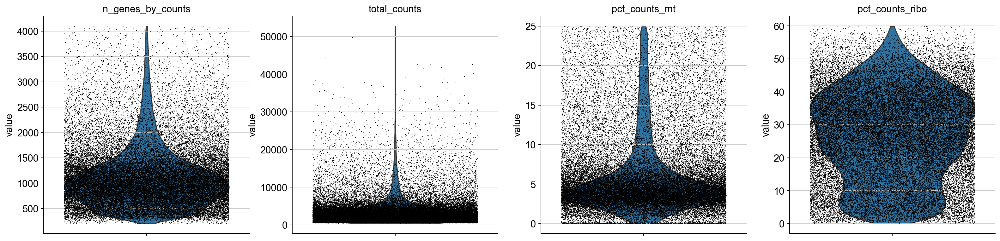

In [27]:
#A violin plot of some of the computed quality measures:
    # the number of genes expressed in the count matrix
    #the total counts per cell
    #the percentage of counts in mitochondrial genes
    #the percentage of counts in ribosomial genes
sc.pl.violin(khaliq_ad, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

In [13]:
#Delete normal samples (leave only tumor)
khaliq_ad_tumor = khaliq_ad[khaliq_ad.obs.Condition == "Tumor", :]

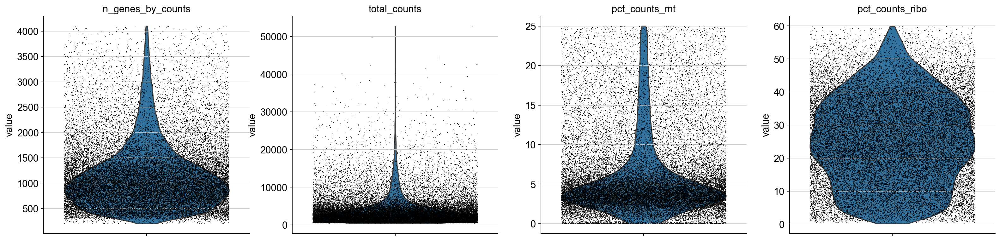

In [29]:
#A violin plot of some of the computed quality measures:
    # the number of genes expressed in the count matrix
    #the total counts per cell
    #the percentage of counts in mitochondrial genes
    #the percentage of counts in ribosomial genes
sc.pl.violin(khaliq_ad_tumor, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo'],
             jitter=0.4, multi_panel=True)

/Users/annamaguza/miniforge3/envs/cell_analysis/lib/python3.10/site-packages/anndata/compat/_overloaded_dict.py:106: ImplicitModificationWarning: Trying to modify attribute `._uns` of view, initializing view as actual.
  self.data[key] = value


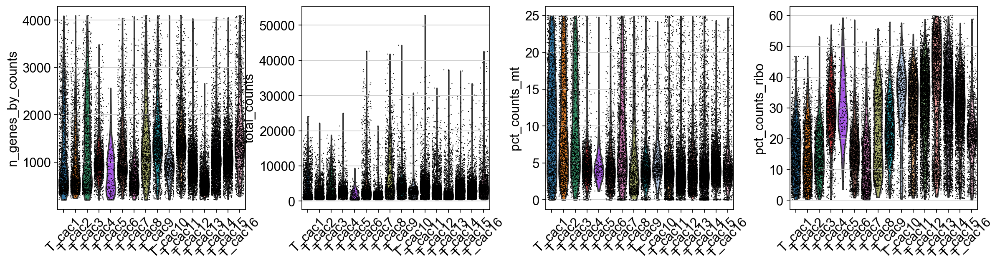

In [31]:
#Check Quality Metrics by Samples
#Create visualisation of QC covariates for samples
sc.pl.violin(khaliq_ad_tumor, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, groupby = 'samples', rotation = 45)

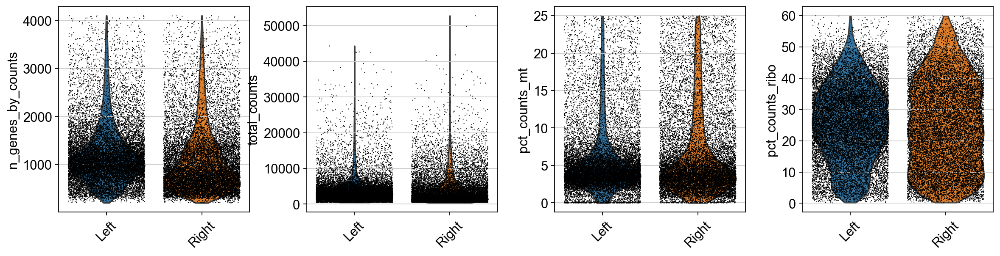

In [32]:
#Check Quality Metrics by Samples
#Create visualisation of QC covariates for Tumor location
sc.pl.violin(khaliq_ad_tumor, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, groupby = 'Location', rotation = 45)

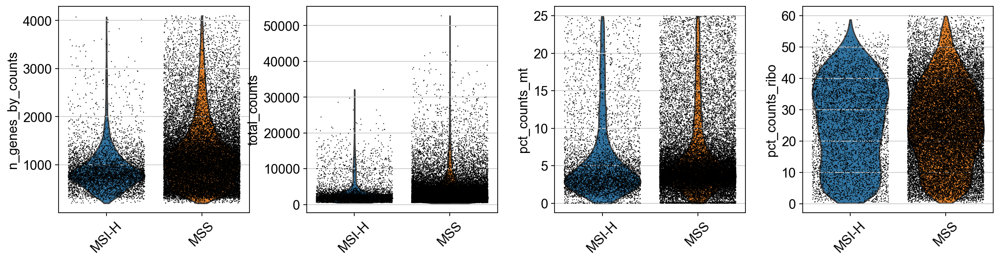

In [33]:
#Check Quality Metrics by Samples
#Create visualisation of QC covariates for MSI status
sc.pl.violin(khaliq_ad_tumor, ['n_genes_by_counts', 'total_counts', 'pct_counts_mt','pct_counts_ribo'],
             jitter=0.4, groupby = 'MSI_Status', rotation = 45)

In [40]:
khaliq_ad_tumor.obs

,samples,Condition,Location,MSI_Status,bulk_prediction,prediction,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo
T_cac1_AAACCTGAGAATAGGG,T_cac1,Tumor,Right,MSS,CMS4,CMS2,504,6.224558,922.0,6.827629,142.0,15.401300,133.0,14.425163
T_cac1_AAACCTGAGCAGCGTA,T_cac1,Tumor,Right,MSS,CMS4,CMS4,3177,8.064007,11519.0,9.351840,526.0,4.566369,1656.0,14.376248
T_cac1_AAACCTGCAATCTGCA,T_cac1,Tumor,Right,MSS,CMS4,CMS3,465,6.144186,831.0,6.723833,166.0,19.975931,50.0,6.016847
T_cac1_AAACCTGGTCTTGCGG,T_cac1,Tumor,Right,MSS,CMS4,CMS3,329,5.799093,527.0,6.269096,32.0,6.072106,99.0,18.785578
T_cac1_AAACCTGGTGTGCCTG,T_cac1,Tumor,Right,MSS,CMS4,CMS3,2887,7.968320,8388.0,9.034677,820.0,9.775870,1501.0,17.894611
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,T_cac9,Tumor,Left,MSS,CMS2,CMS4,1355,7.212294,3463.0,8.150179,147.0,4.244874,853.0,24.631823
T_cac9_TTTGGTTCATAGACTC,T_cac9,Tumor,Left,MSS,CMS2,CMS4,2220,7.705713,7173.0,8.878219,286.0,3.987174,1994.0,27.798689
T_cac9_TTTGGTTCATCTATGG,T_cac9,Tumor,Left,MSS,CMS2,CMS1,1303,7.173192,3283.0,8.096817,263.0,8.010965,771.0,23.484617
T_cac9_TTTGGTTTCAATCTCT,T_cac9,Tumor,Left,MSS,CMS2,CMS1,595,6.390241,995.0,6.903747,107.0,10.753769,33.0,3.316583


In [38]:
#Identification of hightly variable genes to run UMAP
sc.pp.highly_variable_genes(khaliq_ad_tumor, flavor = 'seurat_v3', n_top_genes=2000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [41]:
#Neighbors calculating for UMAp
sc.pp.neighbors(khaliq_ad_tumor, n_neighbors = 50, n_pcs = 50)

computing neighbors
         Falling back to preprocessing with `sc.pp.pca` and default params.
computing PCA
    with n_comps=50
    finished (0:02:21)
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:32)


In [42]:
#UMAP with QC parameters
sc.tl.umap(khaliq_ad_tumor)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:32)


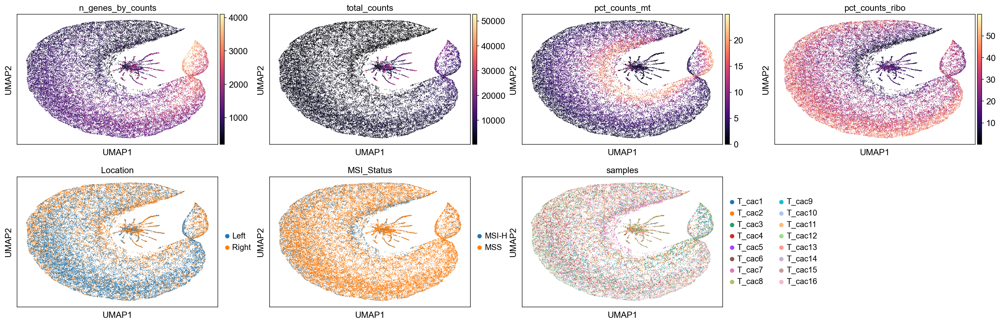

In [43]:
#UMAP with QC parameters
sc.pl.umap(khaliq_ad_tumor, color_map = "magma", color=['n_genes_by_counts', 'total_counts', 'pct_counts_mt', 'pct_counts_ribo', "Location", "MSI_Status", "samples"])

In [36]:
#Mean percentage of ribosomial counts
from statistics import mean
mean(khaliq_ad_tumor.obs.pct_counts_ribo)

25.512582434927833

In [38]:
#Mean percentage of mitochondrial counts
mean(khaliq_ad_tumor.obs.pct_counts_mt)

6.016092421808157

In [41]:
#Total Counts
sum(khaliq_ad_tumor.obs.total_counts)

124985937.0

In [43]:
#Mean Genes per Cell
sum(khaliq_ad_tumor.obs.n_genes_by_counts)/31586

1154.7963021591845

In [44]:
#Mean Reads per Cell
sum(khaliq_ad_tumor.obs.total_counts)/31586

3957.0042740454633

### Doublets identification with scrublet

In [17]:
%matplotlib inline
scrub = scrublet.Scrublet(khaliq_ad_tumor.X)

Preprocessing...
Simulating doublets...
Embedding transcriptomes using PCA...
Calculating doublet scores...
Automatically set threshold at doublet score = 0.53
Detected doublet rate = 0.4%
Estimated detectable doublet fraction = 17.2%
Overall doublet rate:
	Expected   = 10.0%
	Estimated  = 2.5%
Elapsed time: 56.5 seconds


(<Figure size 576x216 with 2 Axes>,
 array([<AxesSubplot:title={'center':'Observed transcriptomes'}, xlabel='Doublet score', ylabel='Prob. density'>,
        <AxesSubplot:title={'center':'Simulated doublets'}, xlabel='Doublet score', ylabel='Prob. density'>],
       dtype=object))

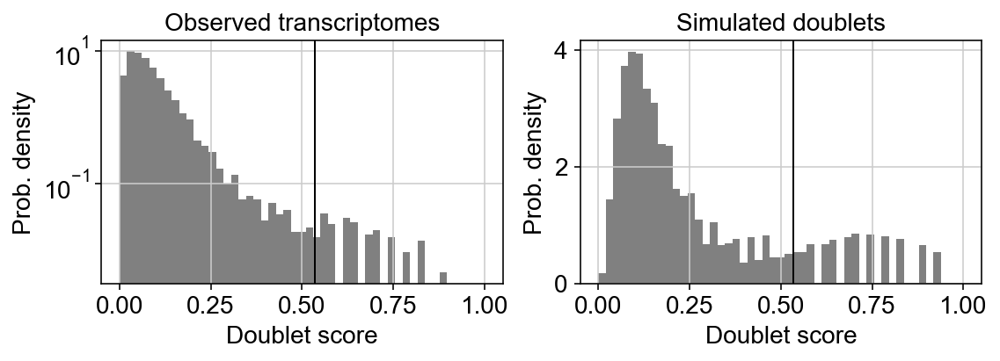

In [18]:
%matplotlib inline
khaliq_ad_tumor.obs['doublet_scores'], khaliq_ad_tumor.obs['predicted_doublets'] = scrub.scrub_doublets()
scrub.plot_histogram()

In [20]:
%matplotlib inline
sum(khaliq_ad_tumor.obs['predicted_doublets'])

138

In [21]:
# add in column with singlet/doublet instead of True/False
khaliq_ad_tumor.obs['doublet_info'] = khaliq_ad_tumor.obs["predicted_doublets"].astype(str)

In [22]:
khaliq_ad_tumor.obs

,samples,Condition,Location,MSI_Status,bulk_prediction,prediction,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,total_counts_mt,pct_counts_mt,total_counts_ribo,pct_counts_ribo,doublet_scores,predicted_doublets,doublet_info
T_cac1_AAACCTGAGAATAGGG,T_cac1,Tumor,Right,MSS,CMS4,CMS2,504,6.224558,922.0,6.827629,142.0,15.401300,133.0,14.425163,0.026300,False,False
T_cac1_AAACCTGAGCAGCGTA,T_cac1,Tumor,Right,MSS,CMS4,CMS4,3177,8.064007,11519.0,9.351840,526.0,4.566369,1656.0,14.376248,0.084592,False,False
T_cac1_AAACCTGCAATCTGCA,T_cac1,Tumor,Right,MSS,CMS4,CMS3,465,6.144186,831.0,6.723833,166.0,19.975931,50.0,6.016847,0.017742,False,False
T_cac1_AAACCTGGTCTTGCGG,T_cac1,Tumor,Right,MSS,CMS4,CMS3,329,5.799093,527.0,6.269096,32.0,6.072106,99.0,18.785578,0.026300,False,False
T_cac1_AAACCTGGTGTGCCTG,T_cac1,Tumor,Right,MSS,CMS4,CMS3,2887,7.968320,8388.0,9.034677,820.0,9.775870,1501.0,17.894611,0.104119,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
T_cac9_TTTGGTTCAACACGCC,T_cac9,Tumor,Left,MSS,CMS2,CMS4,1355,7.212294,3463.0,8.150179,147.0,4.244874,853.0,24.631823,0.072250,False,False
T_cac9_TTTGGTTCATAGACTC,T_cac9,Tumor,Left,MSS,CMS2,CMS4,2220,7.705713,7173.0,8.878219,286.0,3.987174,1994.0,27.798689,0.104119,False,False
T_cac9_TTTGGTTCATCTATGG,T_cac9,Tumor,Left,MSS,CMS2,CMS1,1303,7.173192,3283.0,8.096817,263.0,8.010965,771.0,23.484617,0.298995,False,False
T_cac9_TTTGGTTTCAATCTCT,T_cac9,Tumor,Left,MSS,CMS2,CMS1,595,6.390241,995.0,6.903747,107.0,10.753769,33.0,3.316583,0.041009,False,False


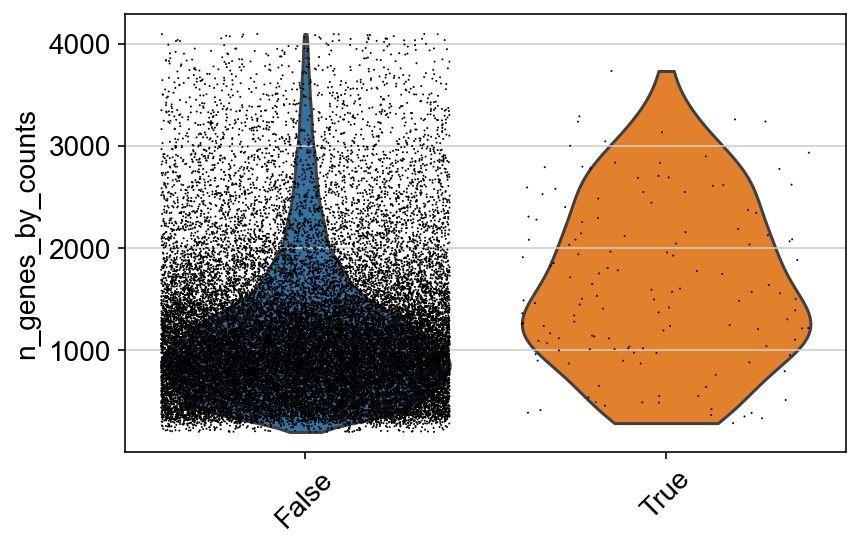

In [23]:
%matplotlib inline
#check if our predicted doublets also have more detected genes in general
sc.pl.violin(khaliq_ad_tumor, 'n_genes_by_counts',
             jitter=0.4, groupby = 'doublet_info', rotation=45)

In [28]:
#Lets run PCA and UMAP and plot doublet scores onto umap to check the doublet predictions.
sc.pp.highly_variable_genes(khaliq_ad_tumor, flavor = 'seurat_v3', n_top_genes=2000)

If you pass `n_top_genes`, all cutoffs are ignored.
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'variances_norm', float vector (adata.var)


In [29]:
khaliq_ad_tumor_scrublet = khaliq_ad_tumor[:, khaliq_ad_tumor.var.highly_variable]

In [30]:
sc.pp.regress_out(khaliq_ad_tumor_scrublet, ['total_counts', 'pct_counts_mt'])

regressing out ['total_counts', 'pct_counts_mt']
    finished (0:01:01)


In [31]:
sc.pp.scale(khaliq_ad_tumor_scrublet, max_value=10)

In [32]:
sc.tl.pca(khaliq_ad_tumor_scrublet, svd_solver='arpack')

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:04)


In [33]:
sc.pp.neighbors(khaliq_ad_tumor_scrublet, n_neighbors = 50, n_pcs = 50)

computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:19)


In [34]:
sc.tl.umap(khaliq_ad_tumor_scrublet)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:32)


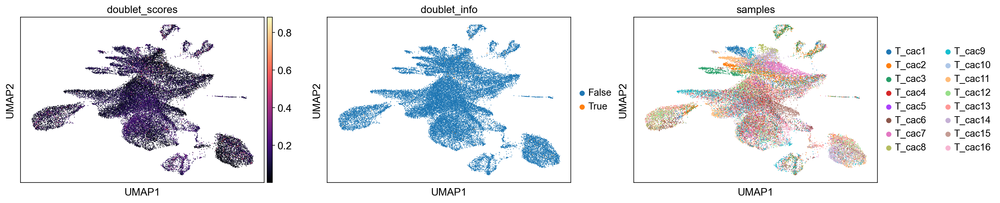

In [36]:
%matplotlib inline
sc.pl.umap(khaliq_ad_tumor_scrublet, color_map = "magma", color=['doublet_scores','doublet_info','samples'])

#### Calculate cell cycle scores

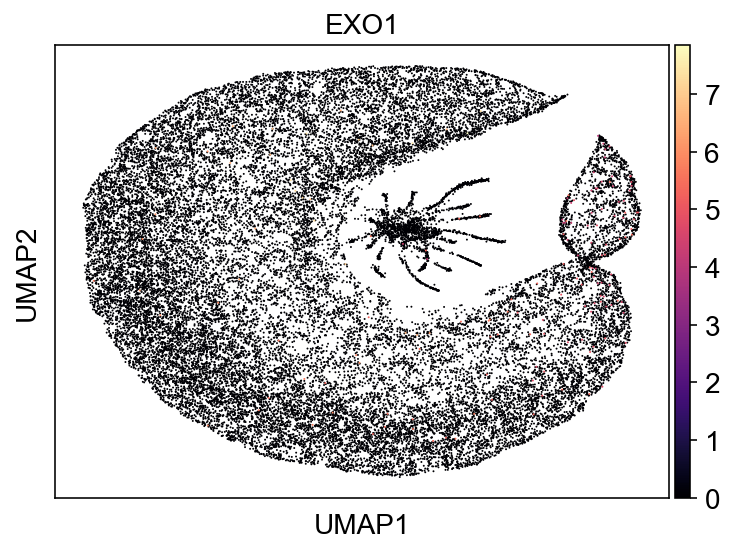

In [55]:
sc.pl.umap(khaliq_ad_tumor, color_map = "magma", color=['EXO1'])

In [50]:
khaliq_ad_tumor.var_names

Index(['AL627309.1', 'AL669831.5', 'FAM87B', 'LINC00115', 'FAM41C',
       'AL645608.3', 'AL645608.1', 'SAMD11', 'NOC2L', 'KLHL17',
       ...
       'MAFIP', 'AC011043.1', 'AL592183.1', 'AC007325.4', 'AC007325.2',
       'AL354822.1', 'AC004556.1', 'AC233755.2', 'AC233755.1', 'AC240274.1'],
      dtype='object', length=23828)

Load cell cycle genes defined in Tirosh et al, 2015. It is a list of 97 genes, represented by their gene symbol. The list here is for humans, in case of alternate organism, a list of ortologues should be compiled. There are major differences in the way Scanpy and Seurat manage data, in particular we need to filter out cell cycle genes that are not present in our dataset to avoid errors.

In [73]:
!if [ ! -f /Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/cell_cycle_genes.txt ]; then curl -o /Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/cell_cycle_genes.txt https://raw.githubusercontent.com/theislab/scanpy_usage/master/180209_cell_cycle/data/regev_lab_cell_cycle_genes.txt; fi

In [74]:
cell_cycle_genes = [x.strip() for x in open('/Users/annamaguza/Desktop/Desktop-Anna/LMU/Master-Thesis/Anna-Master-Project/cell_cycle_genes.txt')]
print(len(cell_cycle_genes))

97


Here we define two lists, genes associated to the S phase and genes associated to the G2M phase

In [76]:
# Split into 2 lists
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]

In [78]:
cell_cycle_genes = [x for x in cell_cycle_genes if x in khaliq_ad_tumor.var_names]
print(len(cell_cycle_genes))

94


In [79]:
#Create basic anndata for score calculation
adata_log = an.AnnData(X = khaliq_ad_tumor.X,  var = khaliq_ad_tumor.var, obs = khaliq_ad_tumor.obs)
sc.pp.normalize_total(adata_log, target_sum = 1e6, exclude_highly_expressed = True)
sc.pp.log1p(adata_log)

normalizing counts per cell The following highly-expressed genes are not considered during normalization factor computation:
[]
    finished (0:00:01)


calculating cell cycle phase
computing score 'S_score'


/Users/annamaguza/miniforge3/envs/cell_analysis/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'S_score', score of gene set (adata.obs).
    600 total control genes are used. (0:01:31)
computing score 'G2M_score'


/Users/annamaguza/miniforge3/envs/cell_analysis/lib/python3.10/site-packages/scanpy/tools/_score_genes.py:151: FutureWarning: Passing a set as an indexer is deprecated and will raise in a future version. Use a list instead.
  for cut in np.unique(obs_cut.loc[gene_list]):


    finished: added
    'G2M_score', score of gene set (adata.obs).
    600 total control genes are used. (0:01:27)
-->     'phase', cell cycle phase (adata.obs)


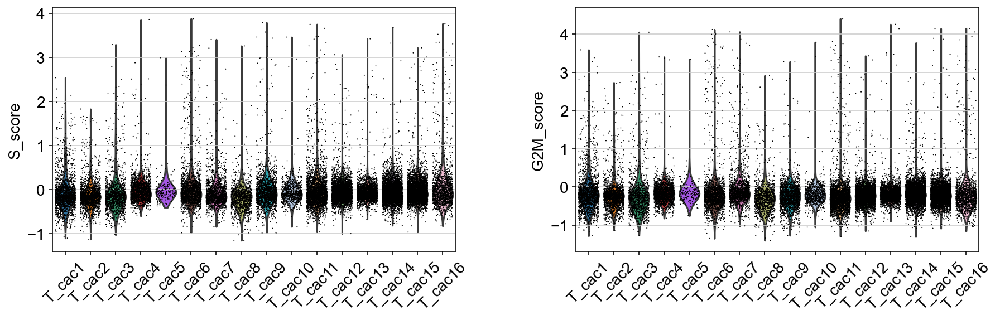

In [81]:
sc.tl.score_genes_cell_cycle(adata_log, s_genes = s_genes, g2m_genes = g2m_genes)
sc.pl.violin(adata_log, ['S_score', 'G2M_score'],
             jitter = 0.4, groupby = 'samples', rotation = 45)

In [82]:
khaliq_ad_tumor.obs['S_score'] = adata_log.obs['S_score']
khaliq_ad_tumor.obs['G2M_score'] = adata_log.obs['G2M_score']
khaliq_ad_tumor

AnnData object with n_obs × n_vars = 31586 × 23828
    obs: 'samples', 'Condition', 'Location', 'MSI_Status', 'bulk_prediction', 'prediction', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'pct_counts_ribo', 'doublet_scores', 'predicted_doublets', 'doublet_info', 'S_score', 'G2M_score'
    var: 'B_cac10_AAACCTGAGTCAATAG', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'mt', 'ribo', 'highly_variable', 'highly_variable_rank', 'means', 'variances', 'variances_norm'
    uns: 'doublet_info_colors', 'hvg', 'neighbors', 'umap', 'Location_colors', 'MSI_Status_colors', 'samples_colors'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'